In [122]:
brain_areas = {
    "Frontal lobe" : { "start" : 1, "end" : 68,
                       "sub_areas" : {
                           "Superior frontal gyrus" : { "start" : 1, "end" : 12},
                           "Middle frontal gyrus" : { "start" : 13, "end" : 28},
                           "Inferior frontal gyrus" : { "start" : 29, "end" : 40},
                           "Orbital gyrus" : { "start" : 41, "end" : 52},
                           "Precentral gyrus" : { "start" : 53, "end" : 68}
                       } },
    "Temporal lobe" : { "start" : 69, "end" : 124,
                       "sub_areas" : {
                           "Superior temporal gyrus" : { "start" : 69, "end" : 80},
                           "Middle temporal gyrus" : { "start" : 81, "end" : 88},
                           "Inferior temporal gyrus" : { "start" : 89, "end" : 102},
                           "Fusiform gyrus" : { "start" : 103, "end" : 108},
                           "Parahippocampal gyrus" : { "start" : 109, "end" : 120},
                           "Posterior superior temporal sulcus" : { "start" : 121, "end" : 124}
                       } },
    "Parietal lobe" : { "start" : 125, "end" : 162,
                       "sub_areas" : {
                           "Superior parietal lobule" : { "start" : 125, "end" : 134},
                           "Inferior parietal lobule" : { "start" : 135, "end" : 146},
                           "Precuneus" : { "start" : 147, "end" : 154},
                           "Postcentral gyrus" : { "start" : 155, "end" : 162}
                       } },
    "Insular lobule" : { "start" : 163, "end" : 174,
                        "sub_areas" : {
                            "Insular gyrus" : { "start" : 163, "end" : 174},
                        } },
    "Limbic lobe" : { "start" : 175, "end" : 188,
                      "sub_areas" : {
                          "Cingulate gyrus" : { "start" : 175, "end" : 188},
                      } },
    "Occipital lobe" : { "start" : 189, "end" : 210,
                         "sub_areas" : {
                             "MedioVentral occipital cortex" : { "start" : 189, "end" : 198},
                             "Cuneus" : { "start" : 199, "end" : 210},
                         } },
    "Subcortical nuclei" : { "start" : 211, "end" : 246,
                             "sub_areas" : {
                                 "Amygdala" : { "start" : 211, "end" : 214},
                                 "Hippocampus" : { "start" : 215, "end" : 218},
                                 "Basal ganglia" : { "start" : 219, "end" : 230},
                                 "Thalamus" : { "start" : 231, "end" : 246},
                             } },   
    "Cerebellum" : { "start" : 247, "end" : 274}
}

In [185]:
brain_area_colors = {
    "Frontal lobe": {
        "color": "#1f77b4",
        "sub_areas": {
            "Superior frontal gyrus": "#aec7e8",
            "Middle frontal gyrus": "#9edae5",
            "Inferior frontal gyrus": "#6baed6",
            "Orbital gyrus": "#c6dbef",
            "Precentral gyrus": "#4292c6"
        }
    },
       "Temporal lobe": {
        "color": "#ff7f0e",
        "sub_areas": {
            "Superior temporal gyrus": "#ffbb78",  # Lighter shade
            "Middle temporal gyrus": "#ff9c50",  # Medium-light shade
            "Inferior temporal gyrus": "#ff7f0e",  # Base color
            "Fusiform gyrus": "#e6550d",  # Slightly darker
            "Parahippocampal gyrus": "#d84a05",  # Darker shade
            "Posterior superior temporal sulcus": "#c23500"  # Darkest shade
        }
    },
    "Parietal lobe": {
        "color": "#2ca02c",
        "sub_areas": {
            "Superior parietal lobule": "#74c476",
            "Inferior parietal lobule": "#a1d99b",
            "Precuneus": "#31a354",
            "Postcentral gyrus": "#41ab5d"
        }
    },
    "Insular lobule": {
        "color": "#d62728",
        "sub_areas": {
            "Insular gyrus": "#fcae91"
        }
    },
    "Limbic lobe": {
        "color": "#9467bd",
        "sub_areas": {
            "Cingulate gyrus": "#bcbddc"
        }
    },
    "Occipital lobe": {
        "color": "#8c564b",
        "sub_areas": {
            "MedioVentral occipital cortex": "#c49c94",
            "Cuneus": "#e7ba52"
        }
    },
    "Subcortical nuclei": {
        "color": "#e7cb94",
        "sub_areas": {
            "Amygdala": "#e7ba52",
            "Hippocampus": "#bd9e39",
            "Basal ganglia": "#8c6d31",
            "Thalamus": "#ad494a"
        }
    },
    "Cerebellum": {
        "color": "#eb4b4b",
        "sub_areas": {}  # Assuming no sub-areas for simplification
    }
}


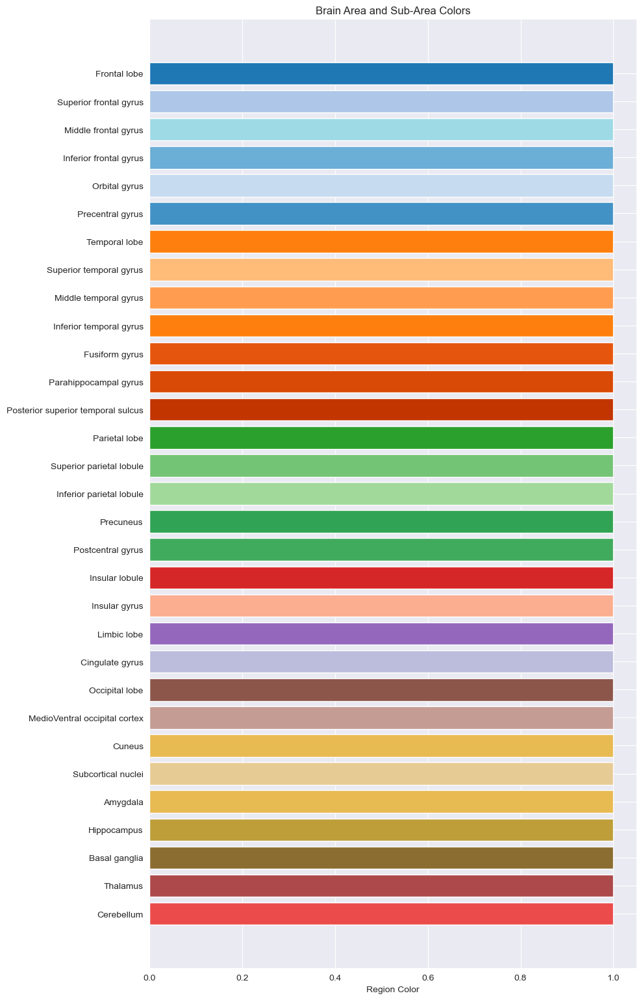

In [186]:
import matplotlib.pyplot as plt

# Assuming the 'brain_area_colors' dictionary is defined as given above

# Flatten the area and sub-area color mappings into a list of tuples
# Each tuple contains the area name and its color
color_mappings = []
for area, info in brain_area_colors.items():
    color_mappings.append((area, info['color']))
    for sub_area, sub_color in info.get('sub_areas', {}).items():
        color_mappings.append((sub_area, sub_color))

# Plotting
fig, ax = plt.subplots(figsize=(10, len(color_mappings) * 0.5))  # Adjust size as needed
ax.barh(range(len(color_mappings)), [1] * len(color_mappings), color=[color for _, color in color_mappings])
ax.set_yticks(range(len(color_mappings)))
ax.set_yticklabels([name for name, _ in color_mappings])
ax.set_xlabel('Region Color')
ax.invert_yaxis()  # Invert y-axis so the first entry is on top

plt.title('Brain Area and Sub-Area Colors')
plt.tight_layout()
plt.show()


In [187]:
import nibabel as nib
import numpy as np
import pandas as pd

md_path = 'Sub2_MD.nii'
atlas_path = 'Sub2_AtlasBNA.nii'

md_img = nib.load(md_path)
atlas_img = nib.load(atlas_path)

md_data = md_img.get_fdata()
atlas_data = atlas_img.get_fdata()

print("Mean Diffusivity (MD) Data Shape:", md_data.shape)
print("Atlas Data Shape:", atlas_data.shape)
print("MD Data Type:", md_data.dtype)
print("Atlas Data Type:", atlas_data.dtype)

print("\nOverall MD Data:")
print("MD Min Value:", np.min(md_data))
print("MD Max Value:", np.max(md_data))
print("MD Mean Value:", np.mean(md_data))
print("MD Standard Deviation:", np.std(md_data))

# Mask MD data where atlas label is not 0 (excluding region 0)
masked_md_data = md_data[atlas_data != 0]

# Calculate statistics for MD data excluding region 0
print("\nMD Data Excluding Region 0:")
print("MD Min Value:", np.min(masked_md_data))
print("MD Max Value:", np.max(masked_md_data))
print("MD Mean Value:", np.mean(masked_md_data))
print("MD Standard Deviation:", np.std(masked_md_data))


Mean Diffusivity (MD) Data Shape: (131, 155, 126)
Atlas Data Shape: (131, 155, 126)
MD Data Type: float64
Atlas Data Type: float64

Overall MD Data:
MD Min Value: 0.0
MD Max Value: 0.013246721691314571
MD Mean Value: 0.00017184854368577248
MD Standard Deviation: 0.0003272147234056046

MD Data Excluding Region 0:
MD Min Value: 0.0
MD Max Value: 0.004479546459944846
MD Mean Value: 0.0006877734959111002
MD Standard Deviation: 0.00018169870447261338


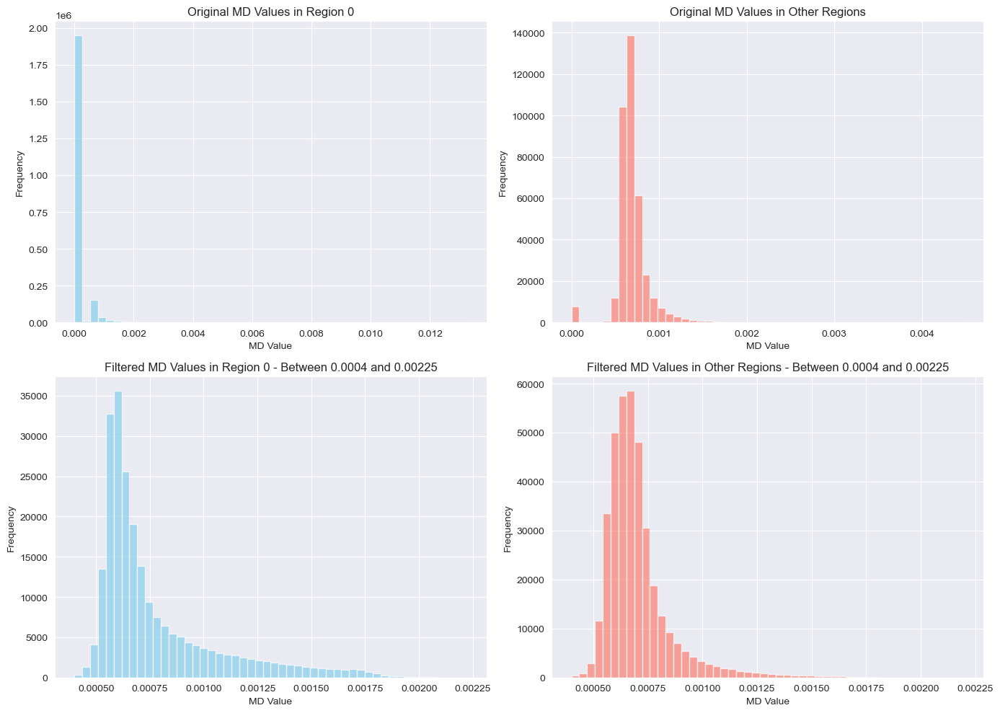

In [188]:
import matplotlib.pyplot as plt

# Original MD values for region 0 and other regions
md_region_0 = md_data[atlas_data == 0]
md_other_regions = md_data[atlas_data != 0]

# Filtered MD values, excluding values less than 0.00001 and more than 0.00025
md_region_0_filtered = md_data[(atlas_data == 0) & (md_data >= 0.0004) & (md_data <= 0.00225)]
md_other_regions_filtered = md_data[(atlas_data != 0) & (md_data >= 0.0004) & (md_data <= 0.00225)]

# Plotting
plt.figure(figsize=(14, 10))

# Original distribution in Region 0
plt.subplot(2, 2, 1)
plt.hist(md_region_0.flatten(), bins=50, color='skyblue', alpha=0.7)
plt.title('Original MD Values in Region 0')
plt.xlabel('MD Value')
plt.ylabel('Frequency')

# Original distribution in Other Regions
plt.subplot(2, 2, 2)
plt.hist(md_other_regions.flatten(), bins=50, color='salmon', alpha=0.7)
plt.title('Original MD Values in Other Regions')
plt.xlabel('MD Value')
plt.ylabel('Frequency')

# Filtered distribution in Region 0
plt.subplot(2, 2, 3)
plt.hist(md_region_0_filtered.flatten(), bins=50, color='skyblue', alpha=0.7)
plt.title('Filtered MD Values in Region 0 - Between 0.0004 and 0.00225')
plt.xlabel('MD Value')
plt.ylabel('Frequency')

# Filtered distribution in Other Regions
plt.subplot(2, 2, 4)
plt.hist(md_other_regions_filtered.flatten(), bins=50, color='salmon', alpha=0.7)
plt.title('Filtered MD Values in Other Regions - Between 0.0004 and 0.00225')
plt.xlabel('MD Value')
plt.ylabel('Frequency')

plt.tight_layout()
plt.savefig('Figures/MD_Distribution.png')
plt.show()


In [189]:
import nibabel as nib
import numpy as np

md_path = 'Sub2_MD.nii'
atlas_path = 'Sub2_AtlasBNA.nii'  # Adjust this to your atlas file path

# Load the MD data and atlas
md_img = nib.load(md_path)
atlas_img = nib.load(atlas_path)

md_data = md_img.get_fdata()
atlas_data = atlas_img.get_fdata()

# Flatten the MD data for processing
md_data_flat = md_data.flatten()

# Assuming atlas_data is aligned with md_data, flatten atlas_data as well
atlas_data_flat = atlas_data.flatten()

# Find the indices of the top 50 highest values in MD data
top_50_indices = np.argpartition(md_data_flat, -50)[-50:]
top_50_values = md_data_flat[top_50_indices]

# Sort the top 50 values and indices by the values in descending order
sorted_top_50_idx = np.argsort(top_50_values)[::-1]
sorted_top_50_indices = top_50_indices[sorted_top_50_idx]
sorted_top_50_values = top_50_values[sorted_top_50_idx]

# Convert flat indices back to 3D coordinates
top_50_coordinates = np.unravel_index(sorted_top_50_indices, md_data.shape)

# Get the region for each of the top 50 voxels
top_50_regions = atlas_data_flat[sorted_top_50_indices]

print("Top 10 Voxels with the Highest MD Values:")
for i in range(50):
    coord = (top_50_coordinates[0][i], top_50_coordinates[1][i], top_50_coordinates[2][i])
    value = sorted_top_50_values[i]
    region = top_50_regions[i]
    print(f"Voxel: {coord}, Value: {value}, Region: {region}")


Top 10 Voxels with the Highest MD Values:
Voxel: (58, 53, 2), Value: 0.013246721691314571, Region: 0.0
Voxel: (65, 52, 4), Value: 0.008654933011887453, Region: 0.0
Voxel: (57, 53, 2), Value: 0.004479546459944846, Region: 266.0
Voxel: (27, 98, 73), Value: 0.0022226638163855782, Region: 0.0
Voxel: (29, 99, 75), Value: 0.0022220010227186966, Region: 0.0
Voxel: (28, 98, 73), Value: 0.0022215565797081885, Region: 0.0
Voxel: (28, 99, 74), Value: 0.002212662679013884, Region: 0.0
Voxel: (29, 98, 75), Value: 0.0021976345202692547, Region: 17.0
Voxel: (65, 45, 9), Value: 0.002189467214795106, Region: 0.0
Voxel: (29, 98, 76), Value: 0.002186211097860581, Region: 0.0
Voxel: (28, 98, 74), Value: 0.00218383685195976, Region: 0.0
Voxel: (89, 38, 81), Value: 0.002183045791995459, Region: 0.0
Voxel: (29, 100, 75), Value: 0.0021745923567177364, Region: 0.0
Voxel: (29, 98, 74), Value: 0.002168012746715306, Region: 17.0
Voxel: (105, 58, 82), Value: 0.002166814096192817, Region: 0.0
Voxel: (29, 97, 78), V

In [190]:
import numpy as np

# Flatten the data for processing
md_data_flat = md_data.flatten()
atlas_data_flat = atlas_data.flatten()

# Find the indices of the top 2000 highest values in MD data
top_2000_indices = np.argpartition(md_data_flat, -2000)[-2000:]
top_2000_values = md_data_flat[top_2000_indices]

# Sort the top 2000 values and indices by the values in descending order
sorted_top_2000_idx = np.argsort(top_2000_values)[::-1]
sorted_top_2000_indices = top_2000_indices[sorted_top_2000_idx]
sorted_top_2000_values = top_2000_values[sorted_top_2000_idx]

# Get the region for each of the top 2000 voxels
top_2000_regions = atlas_data_flat[sorted_top_2000_indices]

# Count how many times each region appears among the top 2000 highest voxels
unique_regions, counts = np.unique(top_2000_regions, return_counts=True)

# Initialize counts for region 0 and other regions
region_0_count = counts[unique_regions == 0][0] if 0 in unique_regions else 0
other_regions_count = np.sum(counts) - region_0_count

# Calculate the percentage of region 0 count
total_count = np.sum(counts)
region_0_percentage = (region_0_count / total_count) * 100

print(f"Region 0 Count: {region_0_count}")
print(f"Other Regions Count: {other_regions_count}")
print(f"Region 0 Percentage of Total: {region_0_percentage:.2f}%")


Region 0 Count: 1880
Other Regions Count: 120
Region 0 Percentage of Total: 94.00%


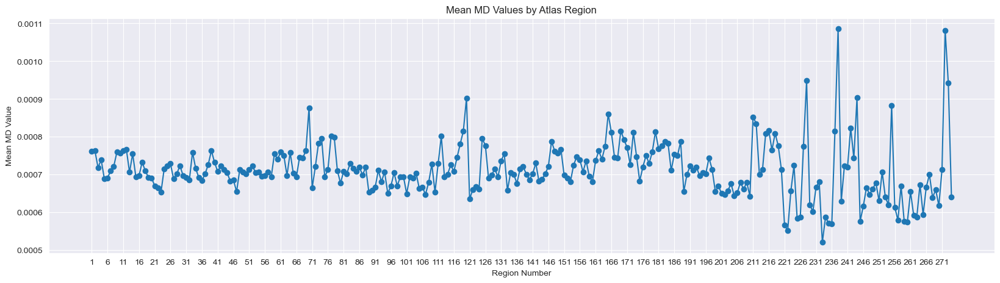

In [209]:
import matplotlib.pyplot as plt
import nibabel as nib
import numpy as np

# Load the MD data and atlas
md_path = 'Sub2_MD.nii'
atlas_path = 'Sub2_AtlasBNA.nii'
md_img = nib.load(md_path)
atlas_img = nib.load(atlas_path)

md_data = md_img.get_fdata()
atlas_data = atlas_img.get_fdata()
md_data = np.where(md_data > 0.00225, 0.00225, md_data)
# Identify voxels in regions >= 1
regions_mask = atlas_data >= 1

# Identify where md_data is less than 0.0005 in these regions
value_mask = md_data < 0.0005

# Combine the two masks to identify where both conditions are True
combined_mask = np.logical_and(regions_mask, value_mask)

# Apply the second condition
md_data[combined_mask] = 0.0005

# Initialize a dictionary to hold the mean MD values for each region
mean_md_values_by_region = {}

# Iterate through each region number from 1 to 274
for region_number in range(1, 275):
    # Create a mask for the current region
    region_mask = atlas_data == region_number
    
    # Use the mask to select MD values for the current region from the MD data
    region_md_values = md_data[region_mask]
    
    # Calculate the mean MD value for the current region, excluding empty regions
    if region_md_values.size > 0:
        mean_md_values_by_region[region_number] = np.mean(region_md_values)
    else:
        mean_md_values_by_region[region_number] = np.nan  # Use NaN for regions without data

# Plotting
plt.figure(figsize=(20, 5))
plt.plot(list(mean_md_values_by_region.keys()), list(mean_md_values_by_region.values()), marker='o')
plt.title('Mean MD Values by Atlas Region')
plt.xlabel('Region Number')
plt.ylabel('Mean MD Value')
plt.grid(True)
plt.xticks(range(1, 275, 5))  # Adjust ticks to show every 5 regions for clarity
plt.savefig('Figures/MD_Region_Line_Plot.png')
plt.show()


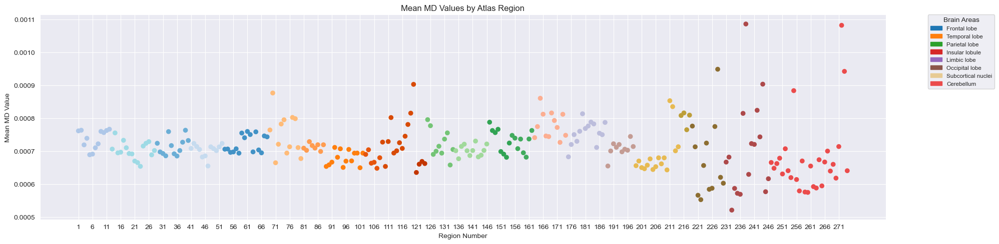

In [197]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

# Assuming 'brain_areas', 'mean_md_values_by_region', and 'brain_area_colors' are already defined

# Initialize a list for region colors based on their area
region_colors = []
for region_number in range(1, 275):
    for area, info in brain_areas.items():
        if "sub_areas" in info:
            for sub_area, sub_info in info["sub_areas"].items():
                if sub_info["start"] <= region_number <= sub_info["end"]:
                    region_colors.append(brain_area_colors[area]["sub_areas"][sub_area])
                    break
            else:
                continue
            break
        elif info["start"] <= region_number <= info["end"]:
            region_colors.append(brain_area_colors[area]["color"])
            break
    else:
        region_colors.append("black")  # Default color if the region is not found
        
legend_entries = []
for area, info in brain_area_colors.items():
    color = info["color"]
    patch = mpatches.Patch(color=color, label=area)
    legend_entries.append(patch)

# Modify here to exclude adding sub-area patches to legend_entries
# The for loop for adding sub-area patches has been removed

# Plotting commands...
plt.figure(figsize=(20, 5))
plt.scatter(list(mean_md_values_by_region.keys()), list(mean_md_values_by_region.values()), 
            c=region_colors, marker='o')
plt.title('Mean MD Values by Atlas Region')
plt.xlabel('Region Number')
plt.ylabel('Mean MD Value')
plt.grid(True)
plt.xticks(range(1, 275, 5))  # Adjust ticks to show every 5 regions for clarity

# Add the legend to the plot
# Now includes only major areas
plt.legend(handles=legend_entries, bbox_to_anchor=(1.05, 1), loc='upper left', title="Brain Areas", fontsize='small', markerscale=0.7, borderaxespad=0.)

plt.tight_layout()
plt.savefig('Figures/MD_Region_Scatter_Plot.png')
plt.show()


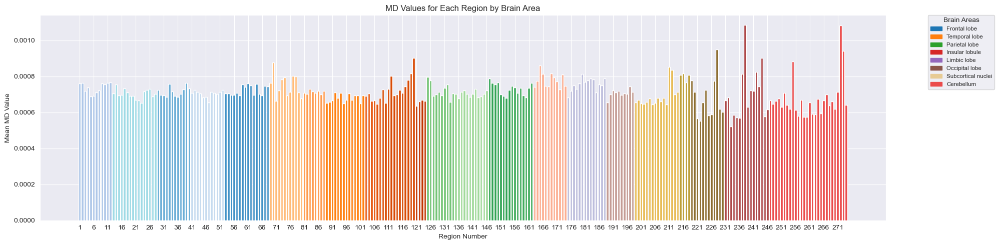

In [195]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

# Assuming 'brain_areas', 'mean_md_values_by_region', and 'brain_area_colors' are already defined

plt.figure(figsize=(20, 5))

# Create an array for the x-axis (region numbers) and for the heights of the bars (MD values)
regions = np.array(list(mean_md_values_by_region.keys()))
md_values = np.array(list(mean_md_values_by_region.values()))

# Initialize a list to hold the colors for each region
colors_for_regions = []

# Populate the colors for each region based on its area
for region_number in regions:
    color_assigned = False  # Flag to check if color was assigned
    for area, info in brain_areas.items():
        if "sub_areas" in info:
            for sub_area, sub_info in info["sub_areas"].items():
                if sub_info["start"] <= region_number <= sub_info["end"]:
                    # Assign color for sub-area
                    colors_for_regions.append(brain_area_colors[area]["sub_areas"][sub_area])
                    color_assigned = True
                    break
            if color_assigned:
                break  # Exit the loop if color was assigned
        elif info["start"] <= region_number <= info["end"]:
            # Assign color for major area
            colors_for_regions.append(brain_area_colors[area]["color"])
            color_assigned = True
            break
    if not color_assigned:
        # Default color if the region is not found
        colors_for_regions.append("black")

# Create bar plot
plt.bar(regions, md_values, color=colors_for_regions)

plt.title('MD Values for Each Region by Brain Area')
plt.xlabel('Region Number')
plt.ylabel('Mean MD Value')
plt.grid(True)
plt.xticks(range(1, 275, 5))  # Adjust ticks to show every 5 regions for clarity

# Prepare legend only for major areas (excluding sub-areas)
legend_entries = [mpatches.Patch(color=info["color"], label=area) for area, info in brain_area_colors.items()]
plt.legend(handles=legend_entries, bbox_to_anchor=(1.05, 1), loc='upper left', title="Brain Areas", fontsize='small', markerscale=0.7, borderaxespad=0.)

plt.tight_layout()
plt.savefig('Figures/MD_Region_Bar_Plot.png')
plt.show()


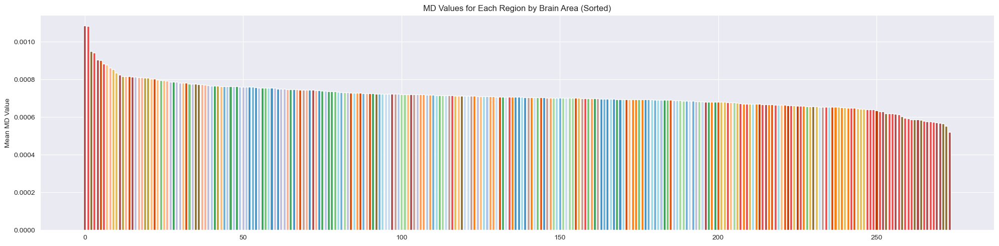

In [196]:
import numpy as np

# Convert lists to numpy arrays for easier handling
regions = np.array(list(mean_md_values_by_region.keys()))
md_values = np.array(list(mean_md_values_by_region.values()))
colors_for_regions = np.array(colors_for_regions)

# Get the sorted indices (in descending order of MD values)
sorted_indices = np.argsort(md_values)[::-1]

# Apply the sorting to regions, MD values, and their corresponding colors
sorted_regions = regions[sorted_indices]
sorted_md_values = md_values[sorted_indices]
sorted_colors_for_regions = colors_for_regions[sorted_indices]

# Now plotting with the sorted values
plt.figure(figsize=(20, 5))
plt.bar(range(len(sorted_regions)), sorted_md_values, color=sorted_colors_for_regions)

plt.title('MD Values for Each Region by Brain Area (Sorted)')
plt.ylabel('Mean MD Value')
plt.grid(True)

plt.tight_layout()
plt.savefig('Figures/MD_Region_Bar_Plot_Sorted.png')
plt.show()


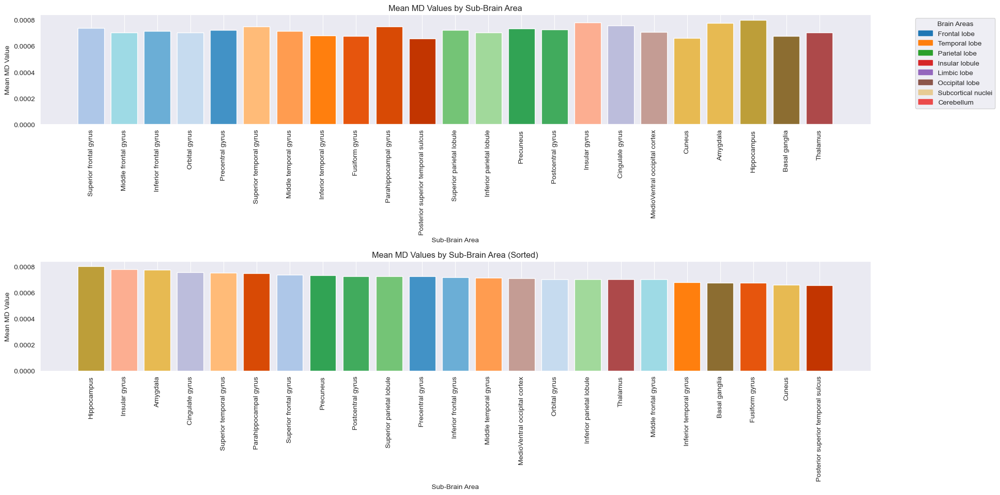

In [200]:
import matplotlib.pyplot as plt
import numpy as np
from collections import OrderedDict
import matplotlib.patches as mpatches

# Assuming 'brain_areas', 'mean_md_values_by_region', and 'brain_area_colors' are already defined

# Initialize a dictionary to store the mean MD values for each sub-area
mean_md_values_by_sub_area = {}
sub_area_colors = {}

# Iterate over each major brain area and its sub-areas
for area, info in brain_areas.items():
    sub_areas = info.get("sub_areas", {})
    for sub_area, sub_info in sub_areas.items():
        # Find regions belonging to the current sub-area
        sub_area_regions = range(sub_info["start"], sub_info["end"] + 1)
        # Aggregate MD values for these regions
        sub_area_md_values = [mean_md_values_by_region[region] for region in sub_area_regions if region in mean_md_values_by_region]
        # Calculate and store the mean MD value for the sub-area
        if sub_area_md_values:
            mean_md_values_by_sub_area[sub_area] = np.mean(sub_area_md_values)
        else:
            mean_md_values_by_sub_area[sub_area] = np.nan
        # Assign color from the brain_area_colors dictionary
        sub_area_colors[sub_area] = brain_area_colors[area]["sub_areas"][sub_area]

# Prepare data for the histogram
sub_area_names = list(mean_md_values_by_sub_area.keys())
sub_area_means = list(mean_md_values_by_sub_area.values())
sub_area_colors_list = [sub_area_colors[name] for name in sub_area_names]

# Sort sub-areas by their mean MD values in descending order for the second plot
sorted_indices = np.argsort(sub_area_means)[::-1]
sorted_sub_area_names = np.array(sub_area_names)[sorted_indices]
sorted_sub_area_means = np.array(sub_area_means)[sorted_indices]
sorted_sub_area_colors = np.array(sub_area_colors_list)[sorted_indices]

# Set up the figure and subplots
fig, axs = plt.subplots(2, 1, figsize=(20, 10))

# First plot: Unsorted
axs[0].bar(sub_area_names, sub_area_means, color=sub_area_colors_list)
axs[0].set_title('Mean MD Values by Sub-Brain Area')
axs[0].set_xlabel('Sub-Brain Area')
axs[0].set_ylabel('Mean MD Value')
axs[0].tick_params(axis='x', rotation=90)
axs[0].grid(axis='y')

# Second plot: Sorted
axs[1].bar(sorted_sub_area_names, sorted_sub_area_means, color=sorted_sub_area_colors)
axs[1].set_title('Mean MD Values by Sub-Brain Area (Sorted)')
axs[1].set_xlabel('Sub-Brain Area')
axs[1].set_ylabel('Mean MD Value')
axs[1].tick_params(axis='x', rotation=90)
axs[1].grid(axis='y')

# Adding legend only for major areas to avoid clutter
legend_patches = [mpatches.Patch(color=info["color"], label=area) for area, info in brain_area_colors.items()]
axs[0].legend(handles=legend_patches, title="Brain Areas", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.savefig('Figures/MD_Sub_Area_Bar_Plot.png')
plt.show()


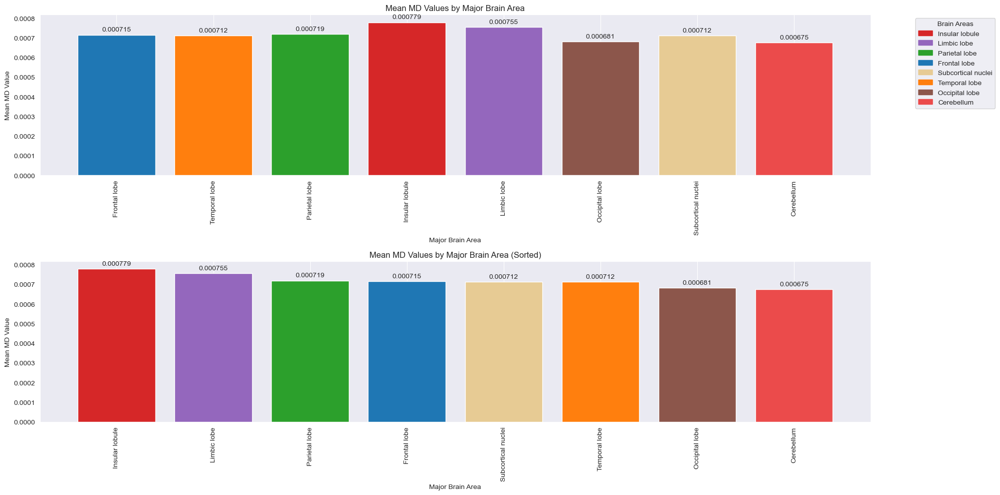

In [210]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

# Assuming 'brain_areas', 'mean_md_values_by_region', and 'brain_area_colors' are already defined

# Initialize a dictionary to store the mean MD values for each major area
mean_md_values_by_major_area = {}

# Iterate over each major brain area to aggregate and calculate mean MD values
for area, info in brain_areas.items():
    # Aggregate MD values for the entire major area
    major_area_regions = np.arange(info["start"], info["end"] + 1)
    major_area_md_values = [mean_md_values_by_region[region] for region in major_area_regions if region in mean_md_values_by_region]

    # Calculate and store the mean MD value for the major area
    if major_area_md_values:
        mean_md_values_by_major_area[area] = np.mean(major_area_md_values)
    else:
        mean_md_values_by_major_area[area] = np.nan  # Use NaN for major areas without MD values

# Prepare data for the histogram
major_area_names = list(mean_md_values_by_major_area.keys())
major_area_means = list(mean_md_values_by_major_area.values())
major_area_colors_list = [brain_area_colors[area]["color"] for area in major_area_names]

# Sort major areas by their mean MD values in descending order for the second plot
sorted_indices = np.argsort(major_area_means)[::-1]
sorted_major_area_names = np.array(major_area_names)[sorted_indices]
sorted_major_area_means = np.array(major_area_means)[sorted_indices]
sorted_major_area_colors = [brain_area_colors[area]["color"] for area in sorted_major_area_names]

# Set up the figure and subplots
fig, axs = plt.subplots(2, 1, figsize=(20, 10))  # 2 rows, 1 column

# First plot: Unsorted
bars1 = axs[0].bar(major_area_names, major_area_means, color=major_area_colors_list)
axs[0].set_title('Mean MD Values by Major Brain Area')
axs[0].set_xlabel('Major Brain Area')
axs[0].set_ylabel('Mean MD Value')
axs[0].tick_params(axis='x', rotation=90)
axs[0].grid(axis='y')

# Add text above each bar for the first plot
for bar in bars1:
    height = bar.get_height()
    axs[0].annotate(f'{height:.6f}', xy=(bar.get_x() + bar.get_width() / 2, height), 
                    xytext=(0, 3), textcoords="offset points", ha='center', va='bottom')

# Second plot: Sorted
bars2 = axs[1].bar(sorted_major_area_names, sorted_major_area_means, color=sorted_major_area_colors)
axs[1].set_title('Mean MD Values by Major Brain Area (Sorted)')
axs[1].set_xlabel('Major Brain Area')
axs[1].set_ylabel('Mean MD Value')
axs[1].tick_params(axis='x', rotation=90)
axs[1].grid(axis='y')

# Add text above each bar for the second plot
for bar in bars2:
    height = bar.get_height()
    axs[1].annotate(f'{height:.6f}', xy=(bar.get_x() + bar.get_width() / 2, height), 
                    xytext=(0, 3), textcoords="offset points", ha='center', va='bottom')

# Create custom legend from unique colors
legend_patches = [mpatches.Patch(color=brain_area_colors[area]["color"], label=area) for area in sorted_major_area_names]
axs[0].legend(handles=legend_patches, title="Brain Areas", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.savefig('Figures/MD_Major_Area_Bar_Plot.png')
plt.show()


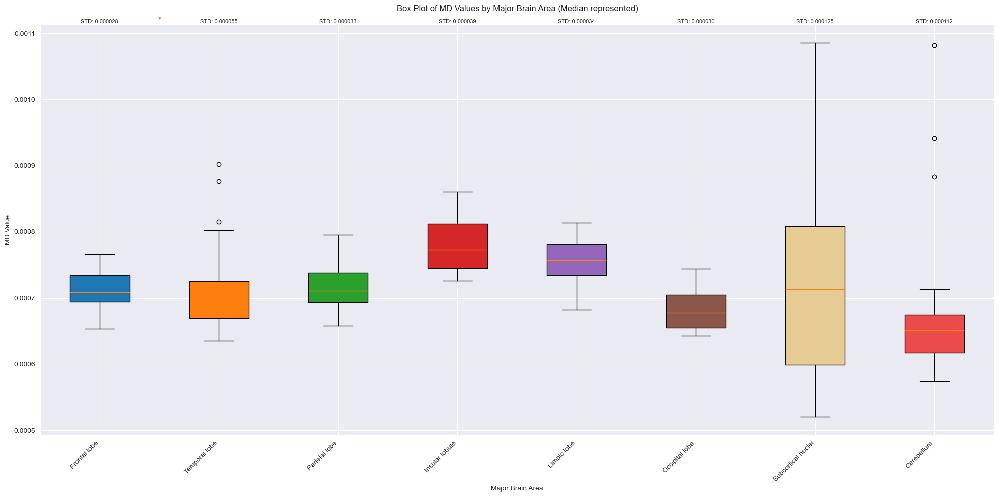

In [208]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'brain_areas', 'mean_md_values_by_region', and 'brain_area_colors' are defined as before

# Initialize dictionaries for aggregating MD values and calculating standard deviations
md_values_by_major_area = {area: [] for area in brain_areas}
std_values_by_major_area = {}

# Populate with MD values for each region
for region_number, md_value in mean_md_values_by_region.items():
    for area, info in brain_areas.items():
        if info["start"] <= region_number <= info["end"]:
            md_values_by_major_area[area].append(md_value)
            break

# Calculate standard deviations
for area in md_values_by_major_area:
    values = md_values_by_major_area[area]
    if values:
        std_values_by_major_area[area] = np.std(values)
    else:
        std_values_by_major_area[area] = np.nan

# Prepare data for the box plot
data_to_plot = [md_values_by_major_area[area] for area in md_values_by_major_area if md_values_by_major_area[area]]
labels = [area for area in md_values_by_major_area if md_values_by_major_area[area]]
std_values = [std_values_by_major_area[area] for area in labels]

# Prepare colors (optional)
box_colors = [brain_area_colors[area]["color"] for area in labels]

plt.figure(figsize=(20, 10))
box = plt.boxplot(data_to_plot, patch_artist=True, labels=labels)

# Coloring the boxes
for patch, color in zip(box['boxes'], box_colors):
    patch.set_facecolor(color)

# Annotating each box with its standard deviation
for i, std in enumerate(std_values, start=1):
    # Position for annotation is determined based on box index `i`
    plt.text(i, plt.ylim()[1], f'STD: {std:.6f}', ha='center', va='bottom', fontsize=8)

# Simplified conceptual approach for indicating significance - manually specify
# For example, assume the first two areas are significantly different
plt.text(1.5, plt.ylim()[1], '*', ha='center', va='bottom', fontsize=12, color='red')

plt.title('Box Plot of MD Values by Major Brain Area (Median represented)\n')
plt.xlabel('Major Brain Area')
plt.ylabel('MD Value')
plt.xticks(rotation=45, ha='right')
plt.grid(True, axis='y')

plt.tight_layout()
plt.savefig('Figures/MD_Major_Area_Box_Plot.png')
plt.show()


In [241]:
import plotly.graph_objects as go
import numpy as np

def plot_brain_areas_by_name(area_name, mode='color', color_sub=False):
    x, y, z, color_data, hover_text_data = [], [], [], [], []

    # Determine the regions to plot based on area_name
    if area_name != "All":
        if area_name in brain_areas:
            start_region, end_region = brain_areas[area_name]['start'], brain_areas[area_name]['end']
        elif any(area_name in info.get('sub_areas', {}) for info in brain_areas.values()):
            for info in brain_areas.values():
                sub_areas = info.get('sub_areas', {})
                if area_name in sub_areas:
                    start_region, end_region = sub_areas[area_name]['start'], sub_areas[area_name]['end']
                    break
        else:
            print(f"Area '{area_name}' not found.")
            return
        regions_to_plot = range(start_region, end_region + 1)
    else:
        regions_to_plot = range(1, 275)  # Assuming 274 regions

    for region_number in regions_to_plot:
        mask = atlas_data == region_number
        if not np.any(mask):
            continue
        xi, yi, zi = np.where(mask)
        x.extend(xi.tolist())
        y.extend(yi.tolist())
        z.extend(zi.tolist())

        voxel_md_values = md_data[mask]
        color, hover_text = 'black', 'Unknown Area'

        for area, info in brain_areas.items():
            if info["start"] <= region_number <= info["end"]:
                if mode == 'color':
                    color = brain_area_colors[area]["color"]
                name = area
                md_major = np.mean(md_data[(atlas_data >= info["start"]) & (atlas_data <= info["end"])]).item()

                hover_text = f"{name}<br>MD (major): {md_major:.6f}"

                if color_sub and "sub_areas" in info:
                    for sub_area, sub_info in info["sub_areas"].items():
                        if sub_info["start"] <= region_number <= sub_info["end"]:
                            if mode == 'color':
                                color = brain_area_colors[area]["sub_areas"][sub_area]
                            md_sub = np.mean(md_data[(atlas_data >= sub_info["start"]) & (atlas_data <= sub_info["end"])]).item()
                            hover_text += f"<br>MD (sub): {md_sub:.6f}"
                break

        if mode == 'md_value':
            color_data.extend(voxel_md_values.tolist())
        else:
            color_data.extend([color] * len(xi))

        for i in range(len(xi)):
            voxel_hover_text = hover_text + f"<br>Voxel: ({xi[i]},{yi[i]},{zi[i]})<br>Voxel MD: {voxel_md_values[i]:.6f}"
            hover_text_data.append(voxel_hover_text)

    colorscale = 'hsv' if mode == 'md_value' else None
    colorbar_title = "MD Values" if mode == 'md_value' else None

    fig = go.Figure(data=[go.Scatter3d(
        x=x, y=y, z=z,
        mode='markers',
        marker=dict(
            size=3,
            color=color_data,
            colorscale=colorscale,
            colorbar=dict(title=colorbar_title),
            opacity=0
        ),
        text=hover_text_data,
        hoverinfo='text'
    )])

    fig.update_layout(title=f"{area_name} Brain Area Visualization ({'Color' if mode == 'color' else 'MD Value'})", margin=dict(l=0, r=0, b=0, t=30))
    fig.show()

# Example usage
plot_brain_areas_by_name('Subcortical nuclei', mode='md_value', color_sub=True)  # Example to show usage with 'md_value' mode
